<a href="https://colab.research.google.com/github/syshiushuy777/Weather-Classification/blob/main/Weather_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

data=pd.read_csv('weather_classification_data.csv')
data.head(5) #phân tích bảng vẽ kết quả khi vẽ ra

,Temperature,Humidity,Wind Speed,Precipitation (%),Cloud Cover,Atmospheric Pressure,UV Index,Season,Visibility (km),Location,Weather Type
0,14.0,73,9.5,82.0,partly cloudy,1010.82,2,Winter,3.5,inland,Rainy
1,39.0,96,8.5,71.0,partly cloudy,1011.43,7,Spring,10.0,inland,Cloudy
2,30.0,64,7.0,16.0,clear,1018.72,5,Spring,5.5,mountain,Sunny
3,38.0,83,1.5,82.0,clear,1026.25,7,Spring,1.0,coastal,Sunny
4,27.0,74,17.0,66.0,overcast,990.67,1,Winter,2.5,mountain,Rainy


In [2]:
data.info() #loại dữ liệu

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13200 entries, 0 to 13199
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Temperature           13200 non-null  float64
 1   Humidity              13200 non-null  int64  
 2   Wind Speed            13200 non-null  float64
 3   Precipitation (%)     13200 non-null  float64
 4   Cloud Cover           13200 non-null  object 
 5   Atmospheric Pressure  13200 non-null  float64
 6   UV Index              13200 non-null  int64  
 7   Season                13200 non-null  object 
 8   Visibility (km)       13200 non-null  float64
 9   Location              13200 non-null  object 
 10  Weather Type          13200 non-null  object 
dtypes: float64(5), int64(2), object(4)
memory usage: 1.1+ MB


In [3]:
data.describe() #phân bố dữ liệu

,Temperature,Humidity,Wind Speed,Precipitation (%),Atmospheric Pressure,UV Index,Visibility (km)
count,13200.000000,13200.000000,13200.000000,13200.000000,13200.000000,13200.000000,13200.000000
mean,19.127576,68.710833,9.832197,53.644394,1005.827896,4.005758,5.462917
std,17.386327,20.194248,6.908704,31.946541,37.199589,3.856600,3.371499
min,-25.000000,20.000000,0.000000,0.000000,800.120000,0.000000,0.000000
25%,4.000000,57.000000,5.000000,19.000000,994.800000,1.000000,3.000000
50%,21.000000,70.000000,9.000000,58.000000,1007.650000,3.000000,5.000000
75%,31.000000,84.000000,13.500000,82.000000,1016.772500,7.000000,7.500000
max,109.000000,109.000000,48.500000,109.000000,1199.210000,14.000000,20.000000


In [6]:
data.groupby("Season").count() #Xem dữ liệu mỗi lớp

,Temperature,Humidity,Wind Speed,Precipitation (%),Cloud Cover,Atmospheric Pressure,UV Index,Visibility (km),Location,Weather Type
Season,,,,,,,,,,
Autumn,2500,2500,2500,2500,2500,2500,2500,2500,2500,2500
Spring,2598,2598,2598,2598,2598,2598,2598,2598,2598,2598
Summer,2492,2492,2492,2492,2492,2492,2492,2492,2492,2492
Winter,5610,5610,5610,5610,5610,5610,5610,5610,5610,5610


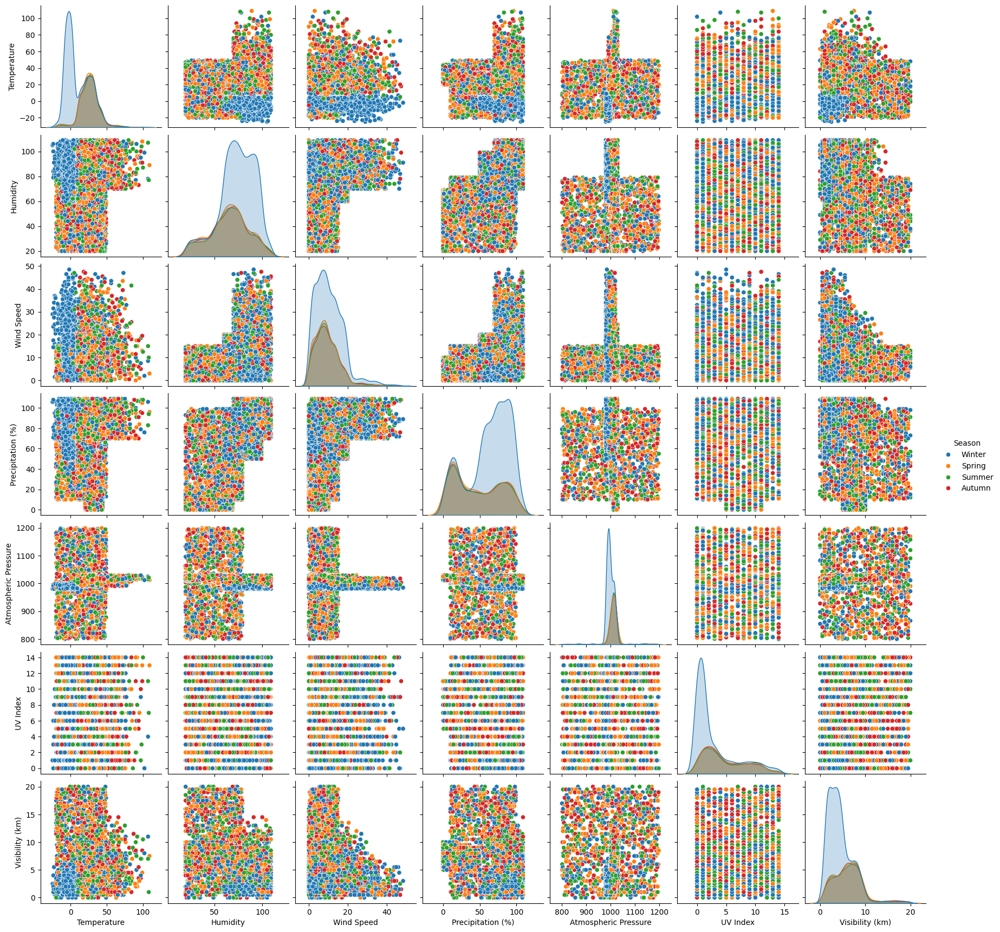

In [5]:
sns.pairplot(data=data, hue="Season") #Xem và vẽ mối quan hệ giữa các đặc trưng với target

In [7]:
data.groupby("Weather Type").count()

,Temperature,Humidity,Wind Speed,Precipitation (%),Cloud Cover,Atmospheric Pressure,UV Index,Season,Visibility (km),Location
Weather Type,,,,,,,,,,
Cloudy,3300,3300,3300,3300,3300,3300,3300,3300,3300,3300
Rainy,3300,3300,3300,3300,3300,3300,3300,3300,3300,3300
Snowy,3300,3300,3300,3300,3300,3300,3300,3300,3300,3300
Sunny,3300,3300,3300,3300,3300,3300,3300,3300,3300,3300


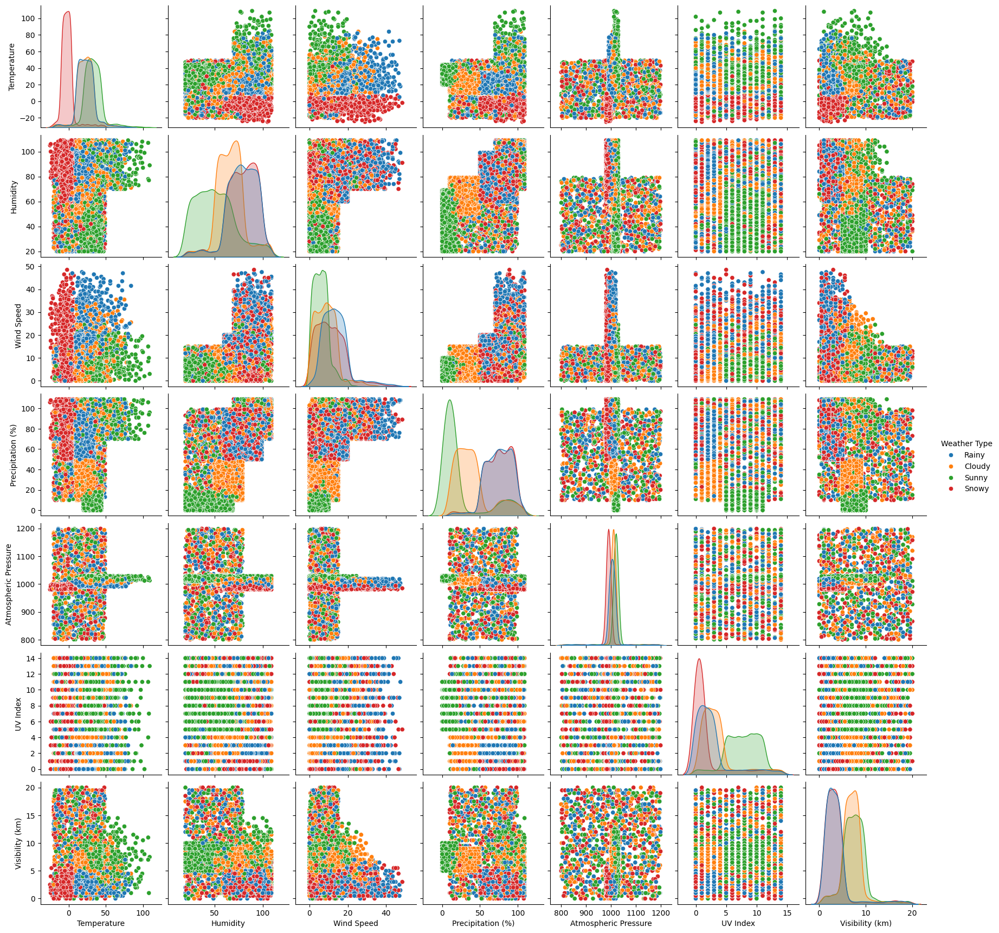

In [8]:
sns.pairplot(data=data, hue="Weather Type")

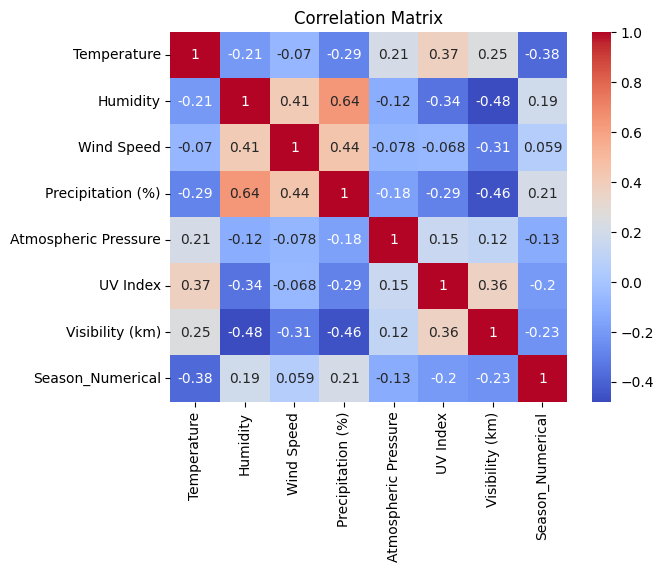

In [27]:
#Correlation Matrix

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data["Season_Numerical"] = label_encoder.fit_transform(data["Season"])

numerical_df = data.select_dtypes(include=["int", "float"])
corr_matrix = numerical_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

plt.title('Correlation Matrix')
plt.show()

In [10]:
import random
import numpy as np
import pandas as pd
import os
from prettytable import PrettyTable
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

pd.set_option('display.max_columns', None)

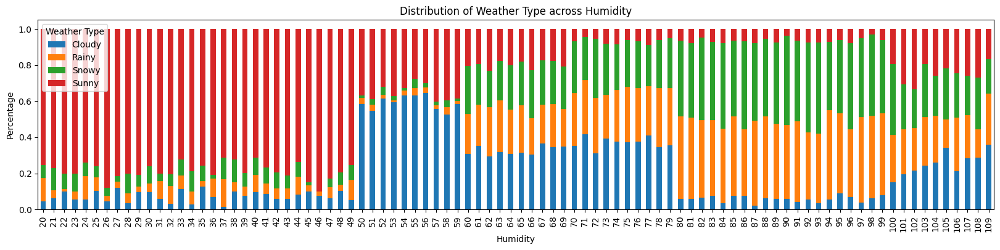

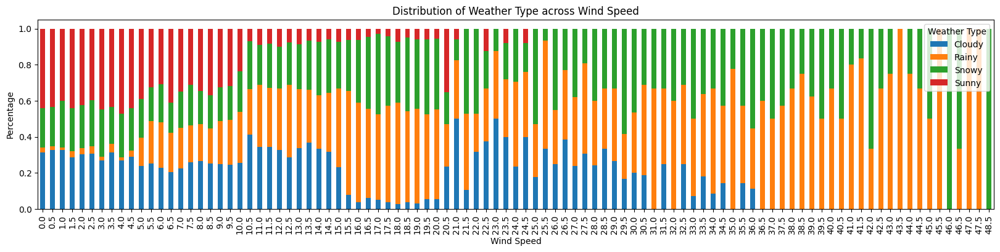

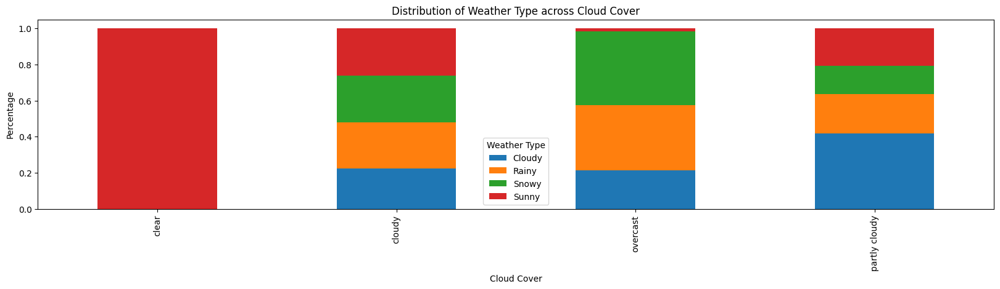

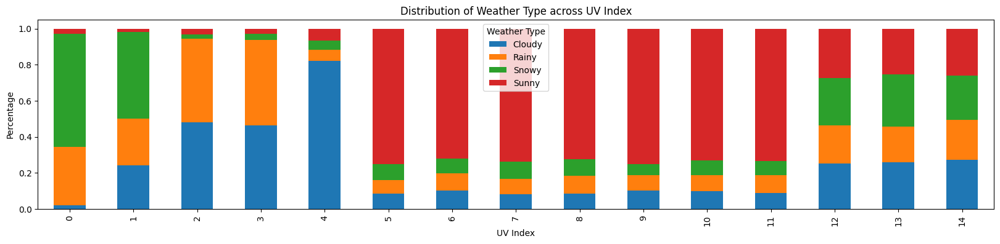

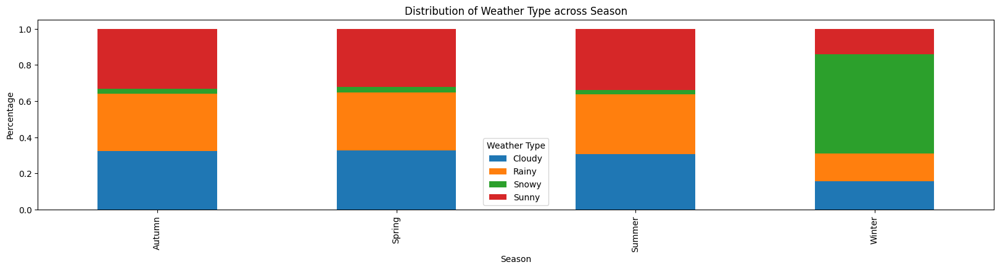

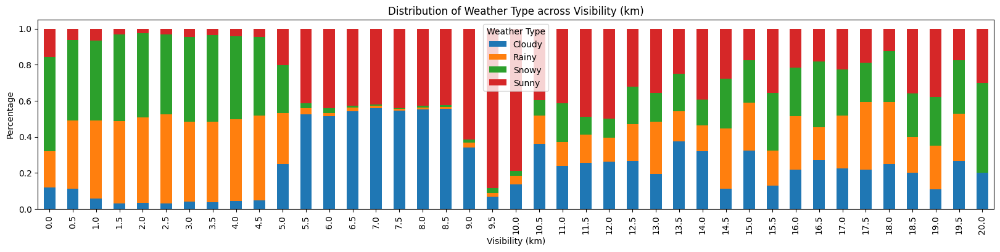

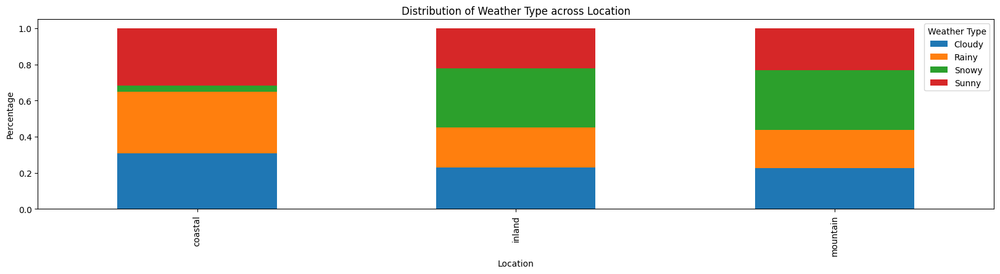

In [11]:
def distribution_of_target(target, dataframe):
    cat_cols = [feature
                for feature in dataframe.columns
                if (dataframe[feature].dtype != 'O' and dataframe[feature].nunique() <100)
                or (dataframe[feature].dtype == 'O' and feature not in [target])
                ]

    for column in cat_cols:
        contingency_table = pd.crosstab(dataframe[column], dataframe[target], normalize='index')
        contingency_table.plot(kind="bar", stacked=True, figsize=(20, 4))

        plt.title(f"Distribution of {target} across {column}")
        plt.xlabel(column)
        plt.ylabel("Percentage")
        plt.legend(title=target)

        plt.show()

distribution_of_target("Weather Type", data) #Phân bố dữ liệu theo Weather Type

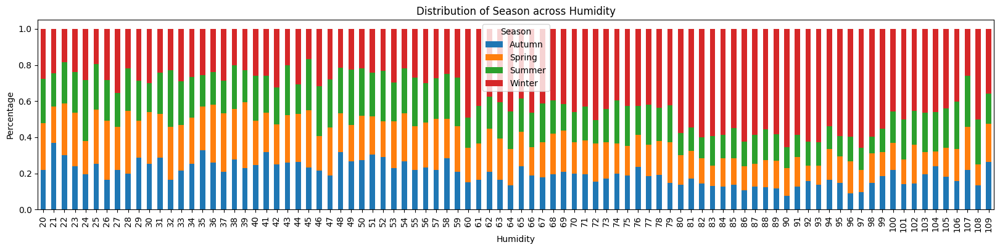

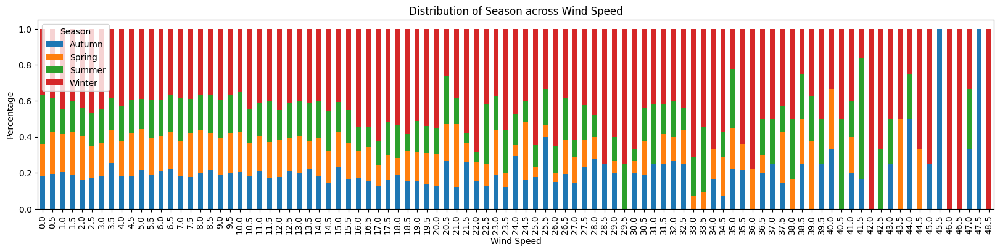

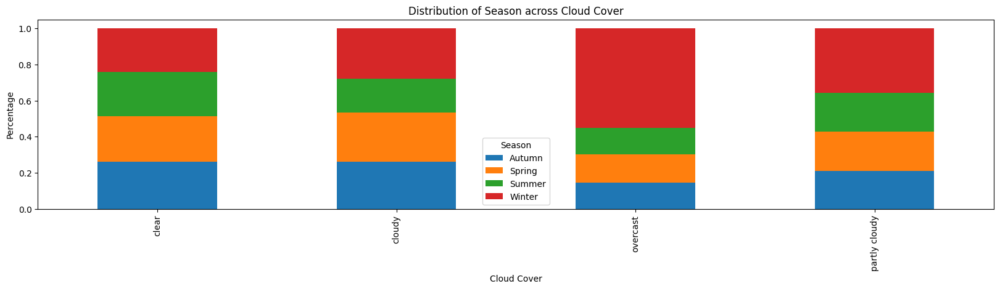

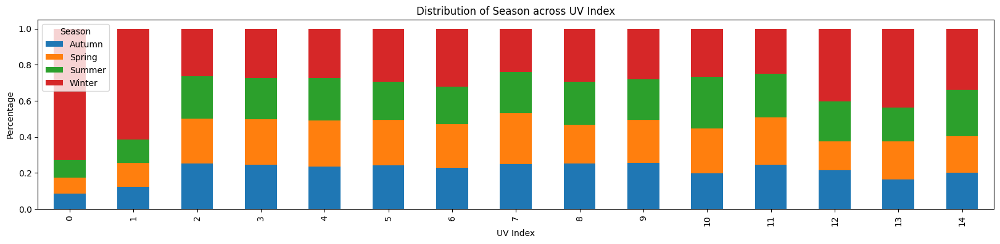

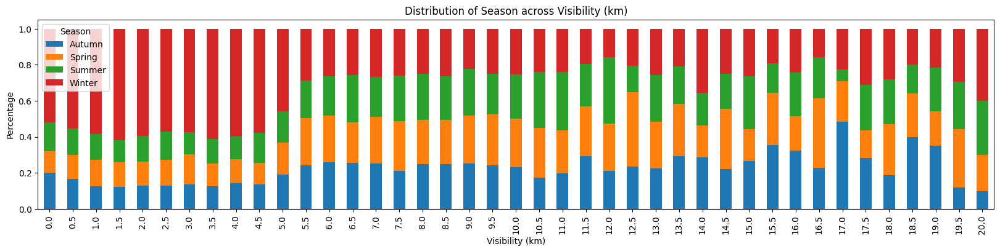

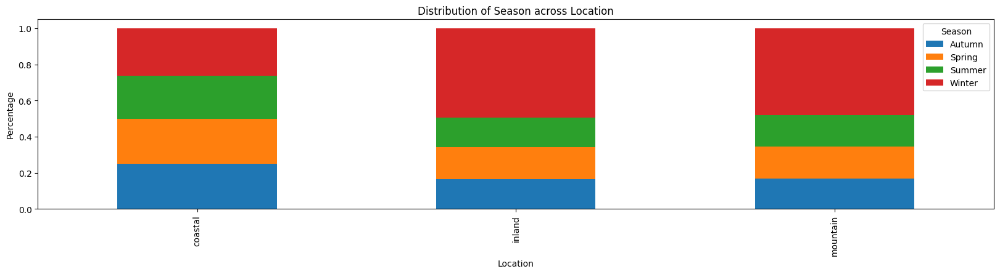

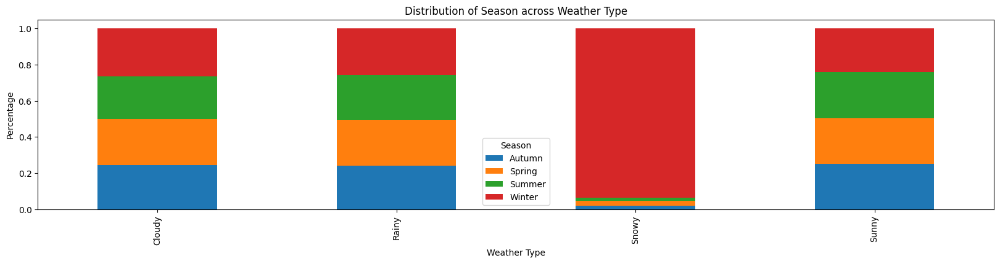

In [12]:
distribution_of_target("Season", data) #Phân bố dữ liệu theo Season

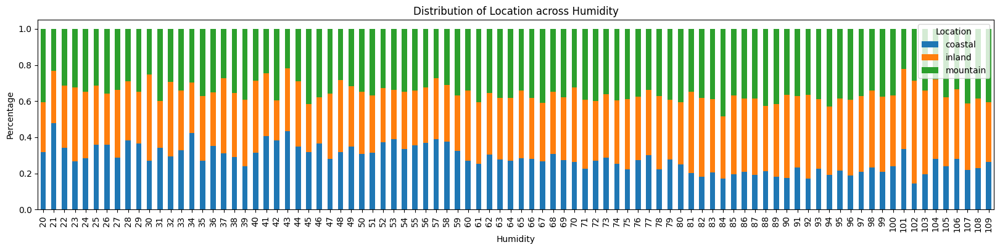

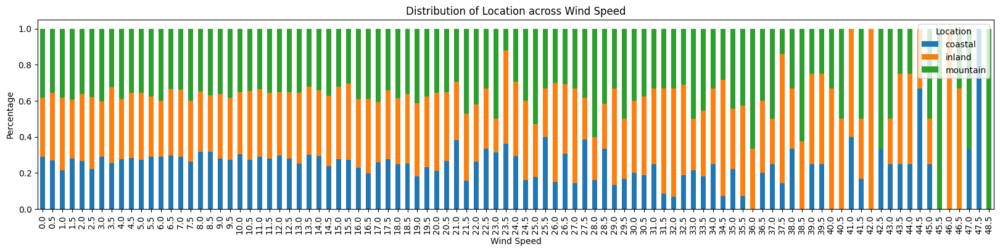

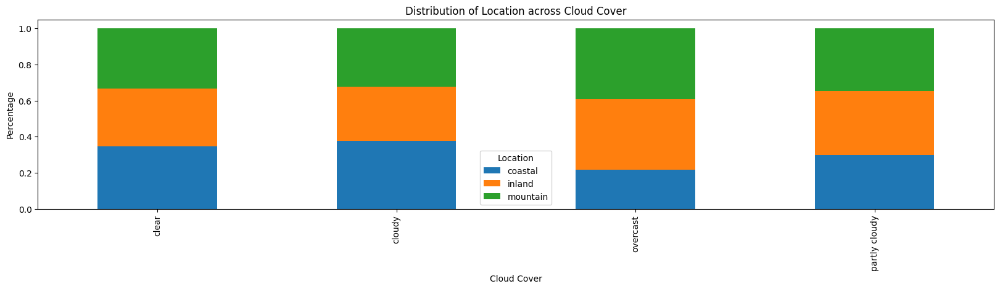

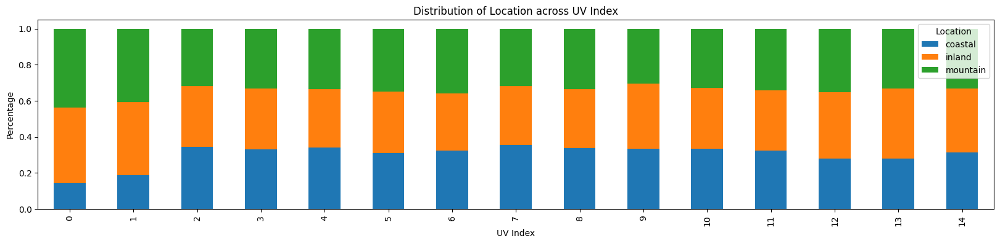

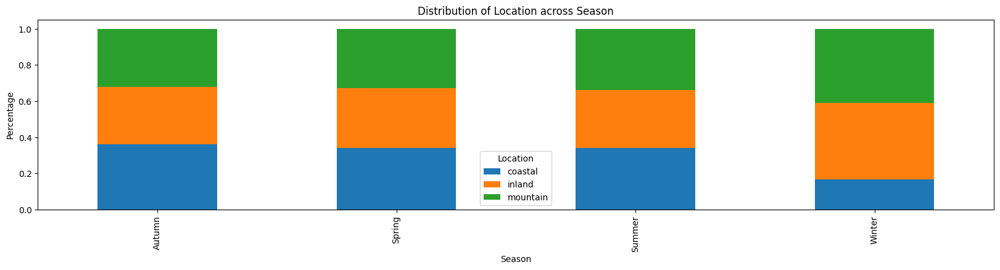

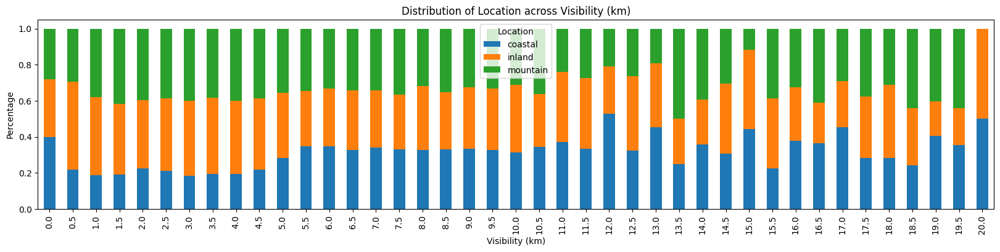

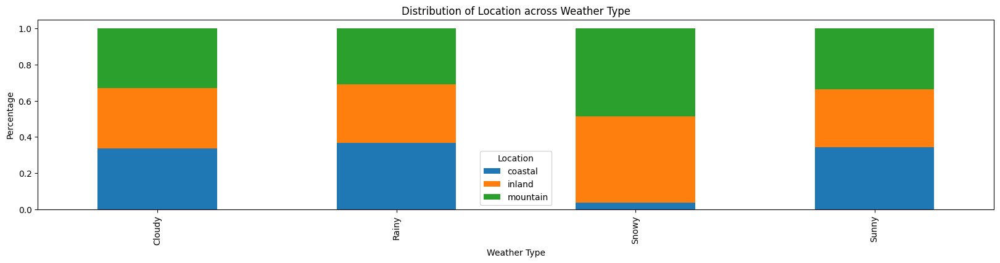

In [18]:
distribution_of_target("Location", data) #Phân bố dữ liệu theo Location

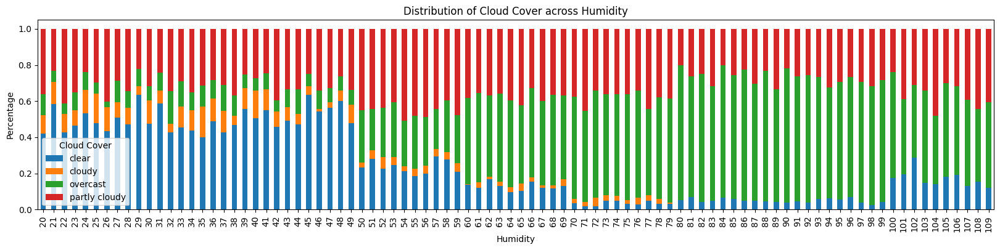

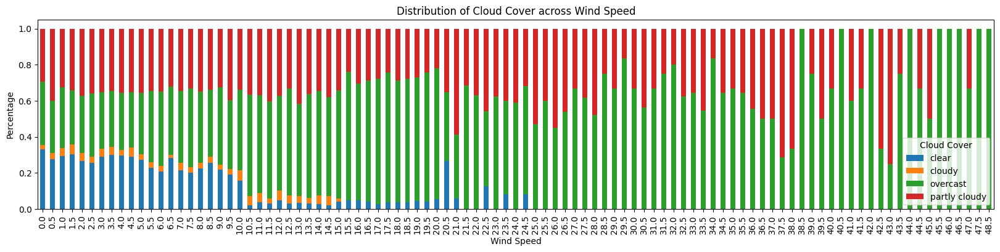

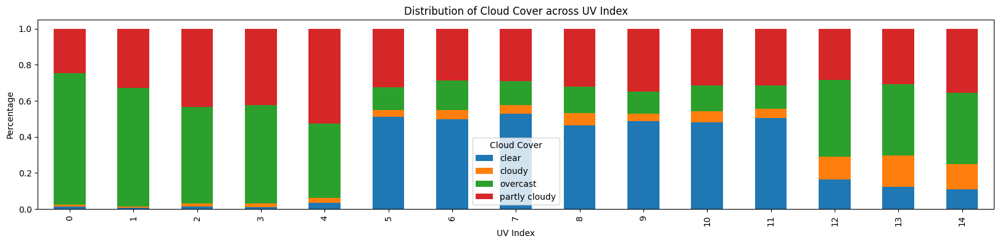

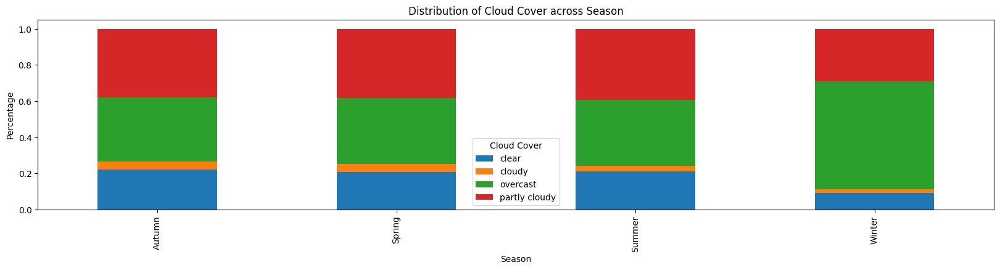

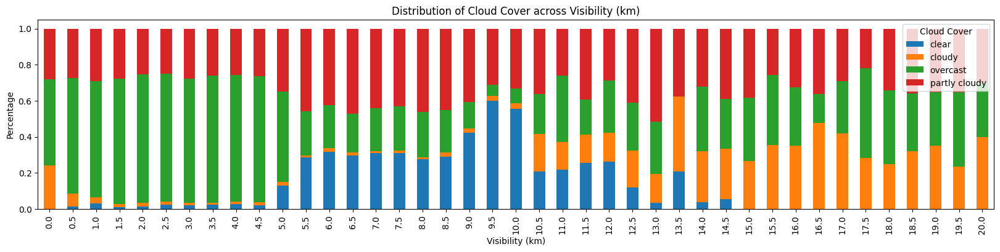

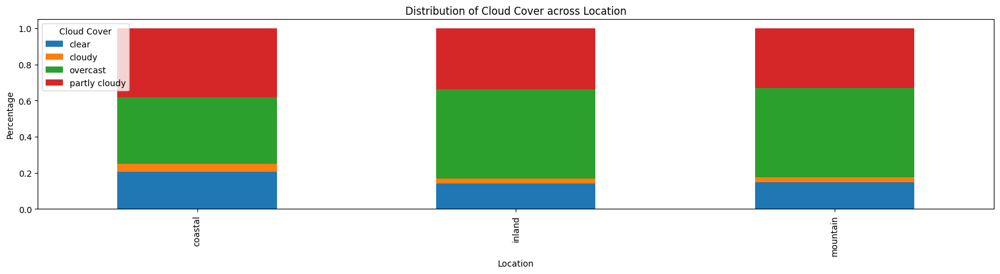

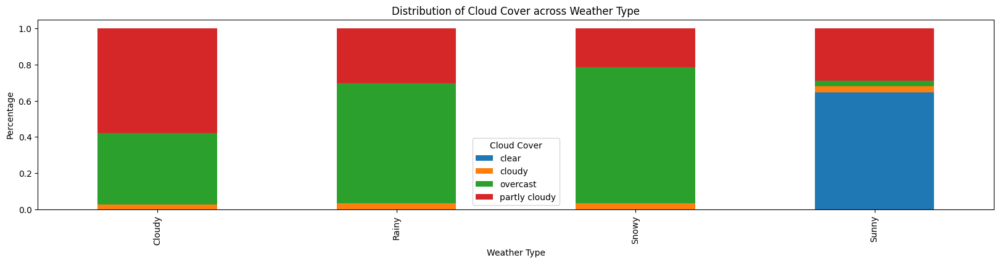

In [15]:
distribution_of_target("Cloud Cover", data) #phân bố dữ liệu theo Cloud

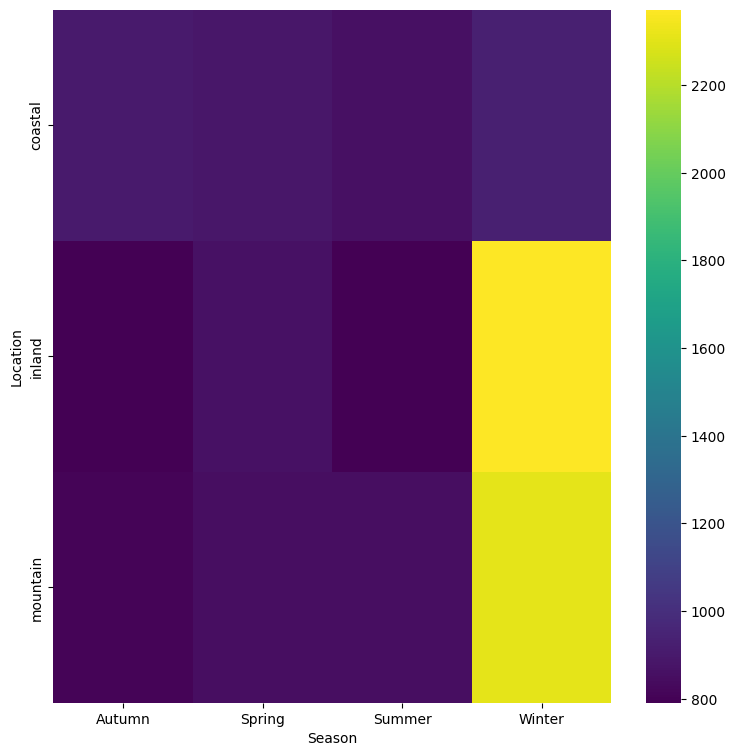

In [20]:
#Ss Season vs Location
plt.subplots(figsize=(9, 9))
df_2dhist = pd.DataFrame({
    x_label: grp['Location'].value_counts()
    for x_label, grp in data.groupby('Season')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Season')
_ = plt.ylabel('Location')

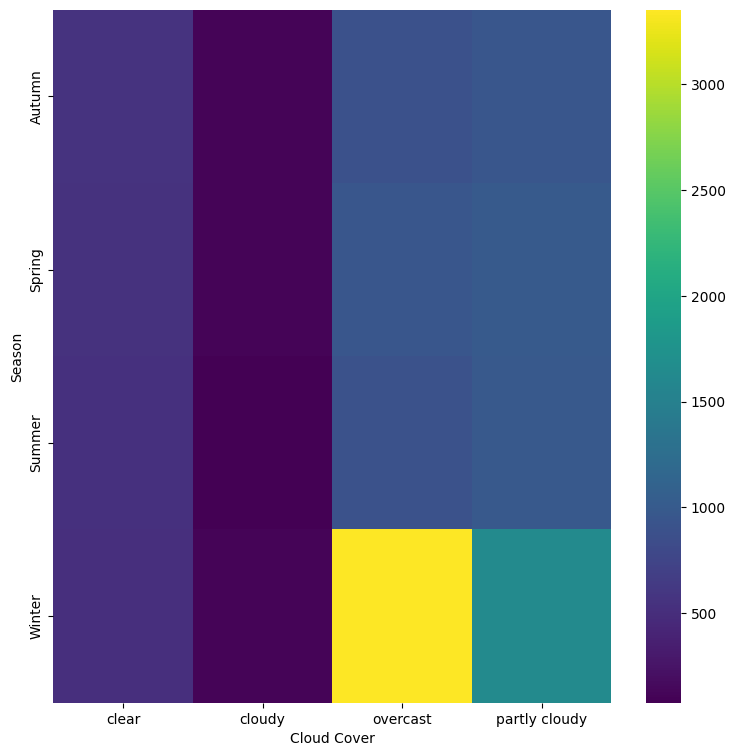

In [22]:
#Ss Season vs Cloud Cover
plt.subplots(figsize=(9, 9))
df_2dhist = pd.DataFrame({
    x_label: grp['Season'].value_counts()
    for x_label, grp in data.groupby('Cloud Cover')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Cloud Cover')
_ = plt.ylabel('Season')

<ipython-input-23-7ad3eaecdf73>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data, x='Temperature', y='Season', inner='box', palette='Dark2')


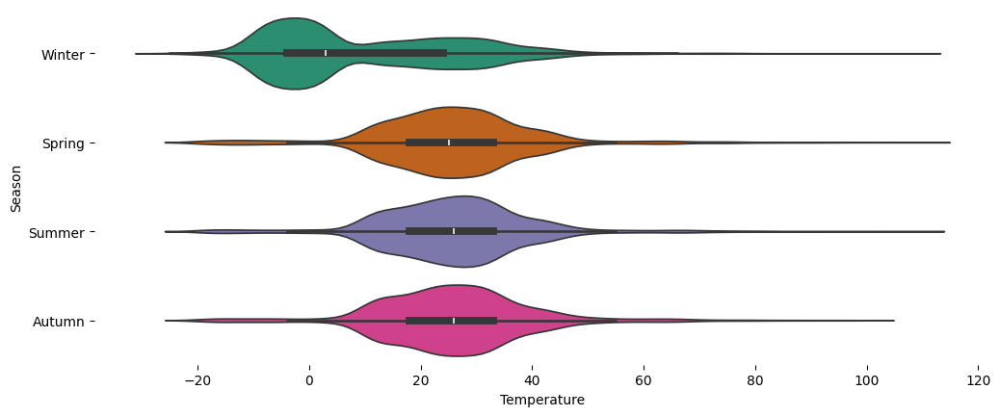

In [23]:
#Ss Season vs Temperature
figsize = (12, 1.2 * len(data['Season'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(data, x='Temperature', y='Season', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<Figure size 1500x1000 with 0 Axes>

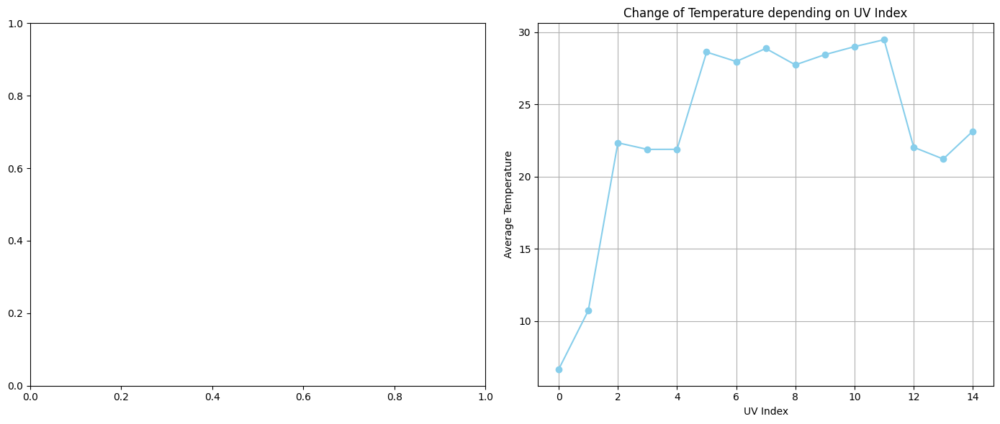

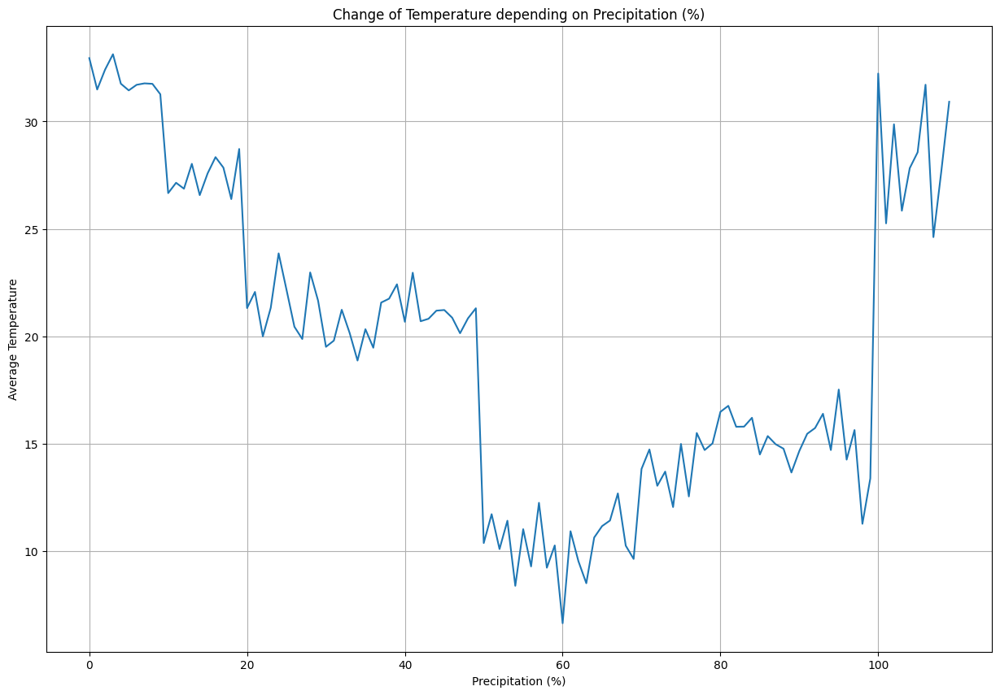

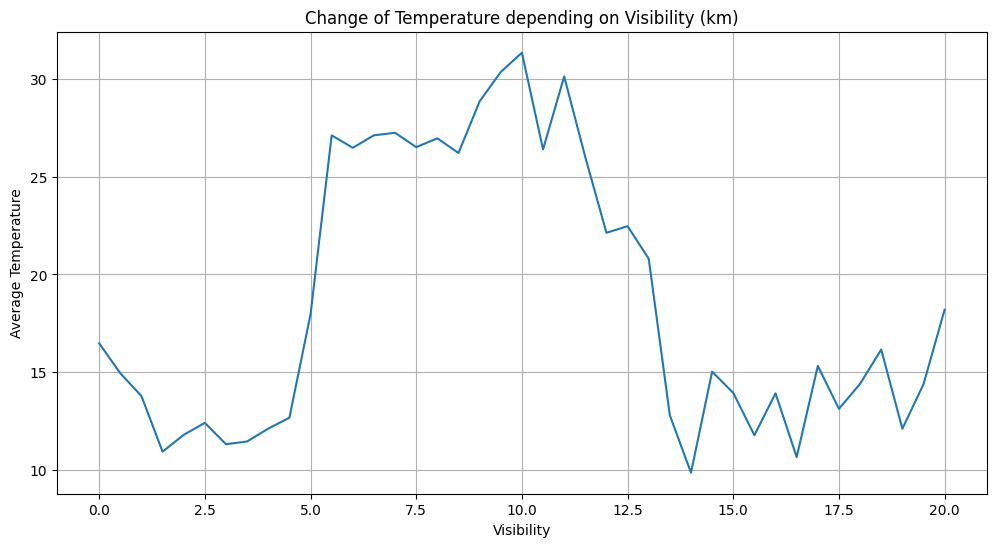

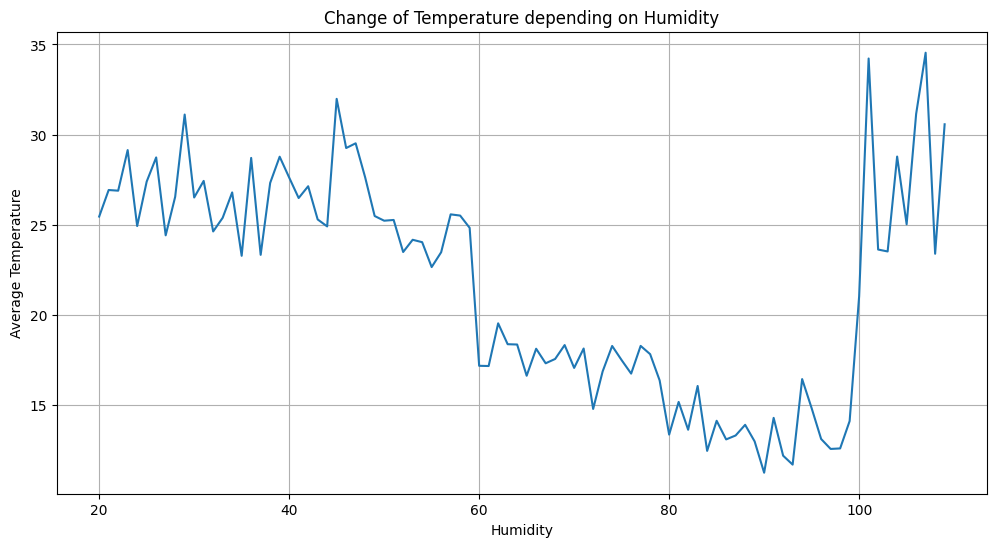

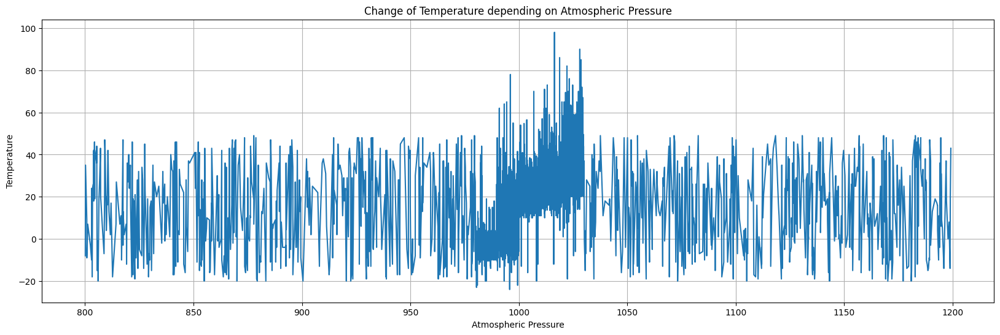

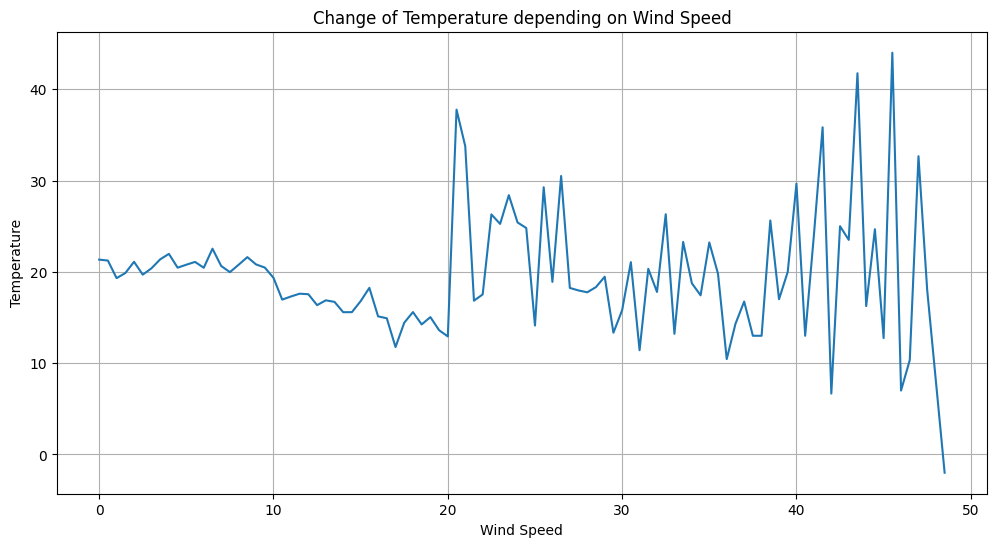

In [14]:
#Sự thay đổi của nhiệt độ

#Change of temperature depending on UV Index
plt.figure(figsize = (15, 10))
temperature_on_uv = data.groupby("UV Index")["Temperature"].mean()
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (14, 6))
temperature_on_uv.plot(kind = 'line', ax = axes[1], color = 'skyblue', marker = 'o')
axes[1].set_title('Change of Temperature depending on UV Index')
axes[1].set_xlabel('UV Index')
axes[1].set_ylabel('Average Temperature')
axes[1].grid(True)
plt.tight_layout()
plt.show()

#Change of temperature depending on precipitation
plt.figure(figsize = (15, 10))
precipitation_on_temperature = data.groupby("Precipitation (%)")["Temperature"].mean()
precipitation_on_temperature.plot(kind = "line")
plt.title('Change of Temperature depending on Precipitation (%)')
plt.xlabel('Precipitation (%)')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()

#Change of temperature depending on visibility
mean_visibility = data.groupby('Visibility (km)')['Temperature'].mean()
plt.figure(figsize=(12,6))
plt.plot(mean_visibility.index,mean_visibility.values)
plt.title('Change of Temperature depending on Visibility (km)')
plt.xlabel('Visibility')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()
plt.close()

#Change of temperature depending on humidity
mean_humidity = data.groupby('Humidity')['Temperature'].mean()
plt.figure(figsize=(12,6))
plt.plot(mean_humidity.index,mean_humidity.values)
plt.title('Change of Temperature depending on Humidity')
plt.xlabel('Humidity')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()
plt.close()

#Change of temperature depending on atmospheric pressure
mean_atmpress = data.groupby("Atmospheric Pressure")['Temperature'].mean()
plt.figure(figsize=(20,6))
plt.plot(mean_atmpress.index,mean_atmpress.values)
plt.title('Change of Temperature depending on Atmospheric Pressure')
plt.xlabel('Atmospheric Pressure')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()
plt.close()

#Change of temperature depending on wind speed
mean_wspeed = data.groupby("Wind Speed")['Temperature'].mean()
plt.figure(figsize=(12,6))
plt.plot(mean_wspeed.index,mean_wspeed.values)
plt.title('Change of Temperature depending on Wind Speed')
plt.xlabel('Wind Speed')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()
plt.close()

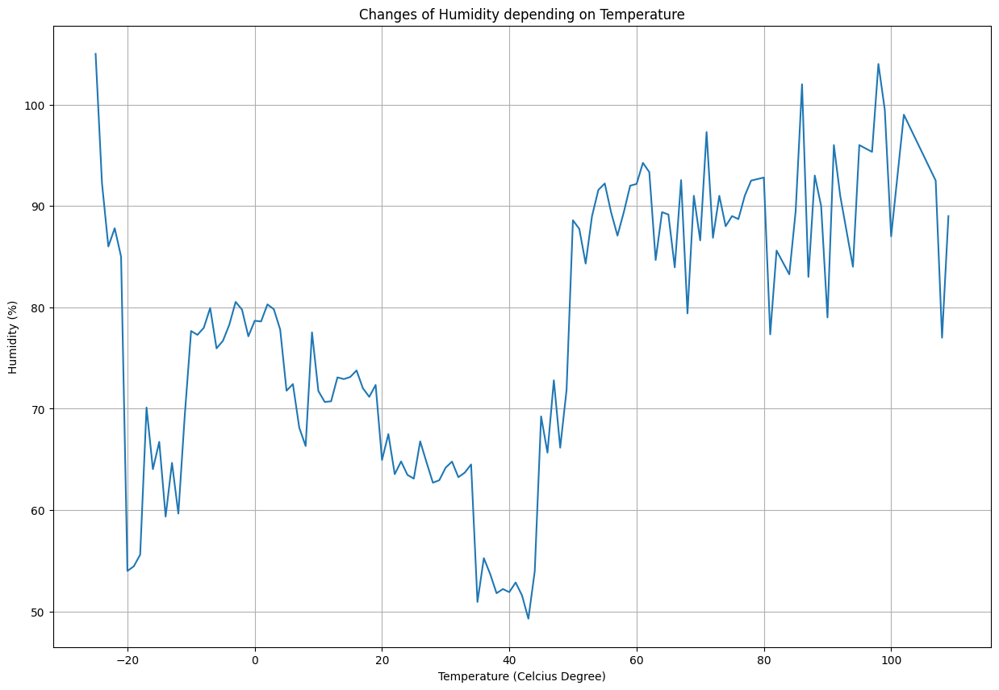

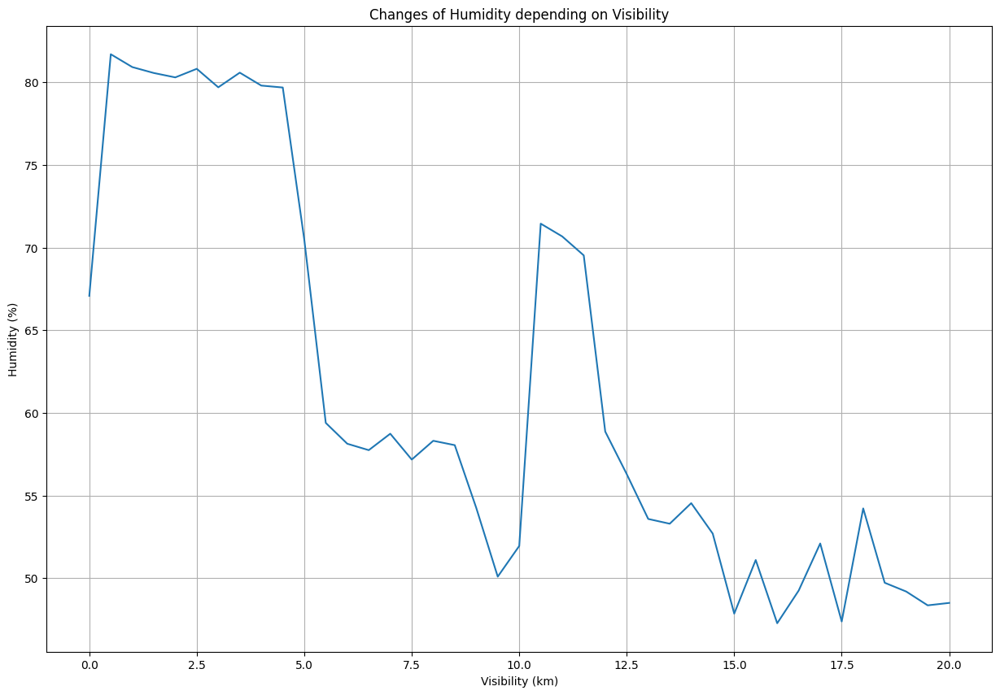

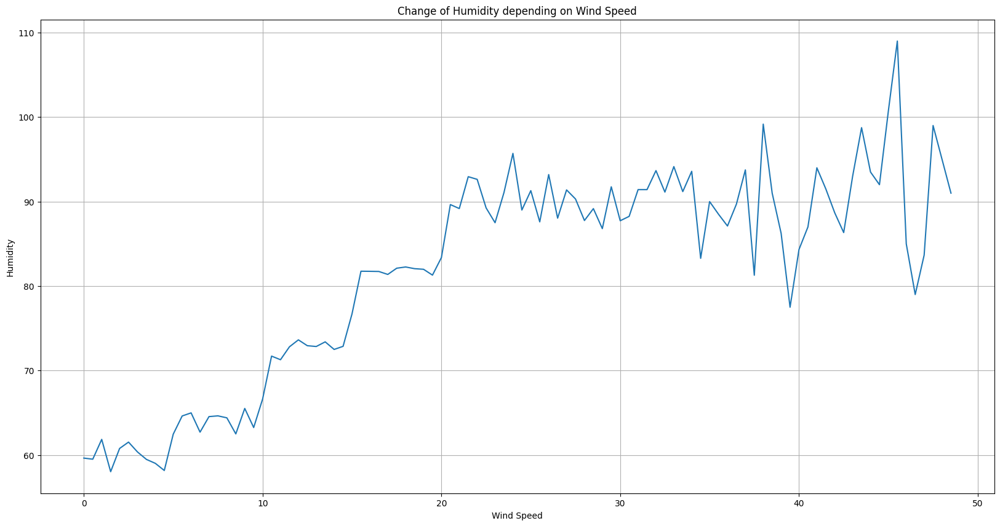

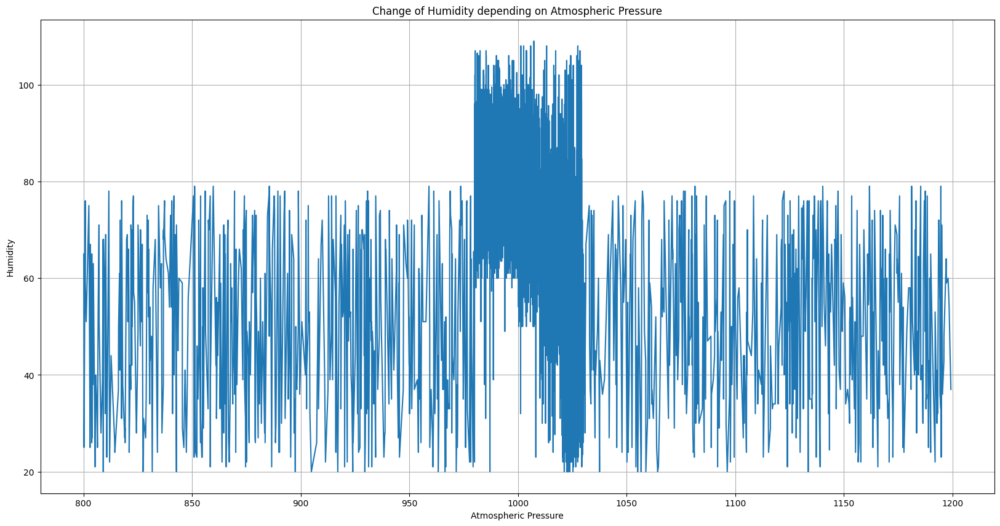

In [17]:
#Sự thay đổi của độ ẩm so với các chỉ số

#Change of humidity depending on temperature
plt.figure(figsize=(15, 10))
temperature_on_humidity=data.groupby("Temperature")["Humidity"].mean()
temperature_on_humidity.plot(kind="line")
plt.title('Changes of Humidity depending on Temperature')
plt.ylabel('Humidity (%)')
plt.xlabel('Temperature (Celcius Degree)')
plt.grid(True)
plt.show()

#Change of humidity depending on visibility
plt.figure(figsize=(15, 10))
humidity_on_visibility=data.groupby("Visibility (km)")["Humidity"].mean()
humidity_on_visibility.plot(kind="line")
plt.title('Changes of Humidity depending on Visibility')
plt.ylabel('Humidity (%)')
plt.xlabel('Visibility (km)')
plt.grid(True)
plt.show()

#Change of humidity depending on wind speed
plt.figure(figsize=(20, 10))
humidity_on_wind_speed=data.groupby("Wind Speed")["Humidity"].mean()
humidity_on_wind_speed.plot(kind='line')
plt.title('Change of Humidity depending on Wind Speed')
plt.xlabel('Wind Speed')
plt.ylabel('Humidity')
plt.grid(True)
plt.show()

#Change of humidity depending on atmospheric pressure
plt.figure(figsize=(20,10))
humidity_on_atmospheric_pressure=data.groupby("Atmospheric Pressure")["Humidity"].mean()
humidity_on_atmospheric_pressure.plot(kind='line')
plt.title('Change of Humidity depending on Atmospheric Pressure')
plt.xlabel('Atmospheric Pressure')
plt.ylabel('Humidity')
plt.grid(True)
plt.show()